In [ ]:
!pip install opencv-python numpy

In [ ]:
import cv2
import numpy
from google.colab.patches import cv2_imshow
from skimage.util import random_noise
import matplotlib.pyplot as plt

In [ ]:
img = cv2.imread('fruits.jpg')

In [ ]:
# print(img)

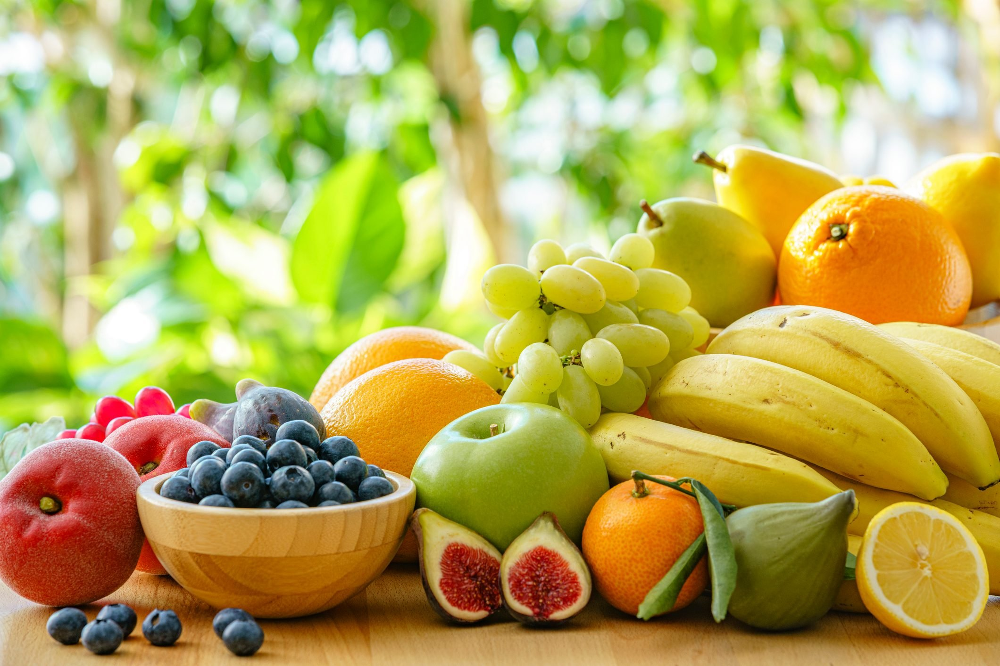

In [ ]:
cv2_imshow(img)

In [ ]:
print(img.shape)

(1414, 2120, 3)


In [ ]:
print(img.size)

8993040


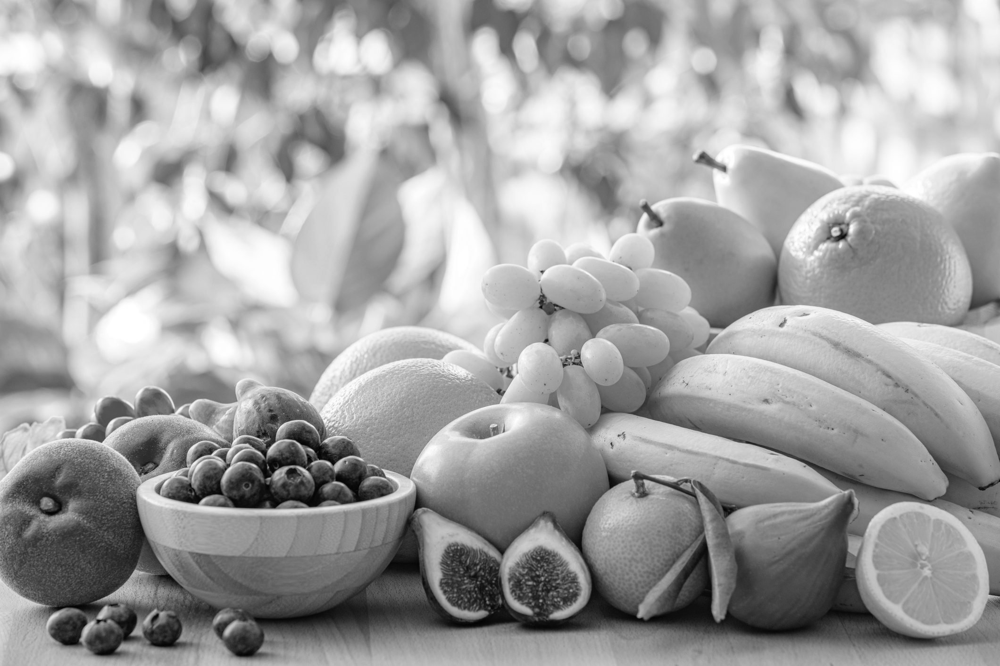

In [ ]:
grey_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(grey_img)

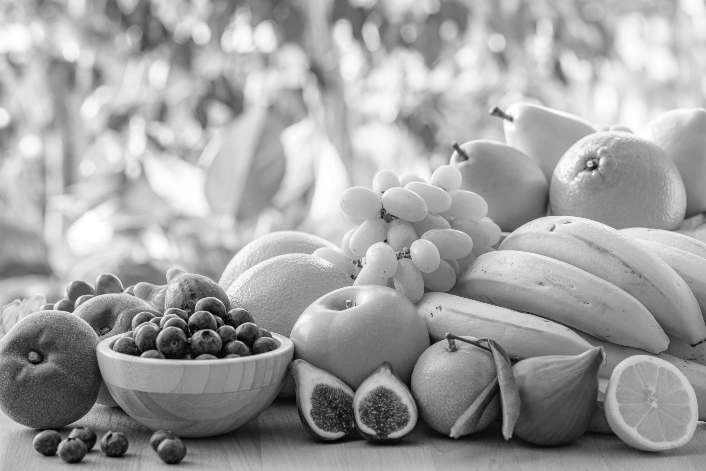

(471, 706)


In [ ]:
img_resize = cv2.resize(grey_img, (grey_img.shape[1]//3, grey_img.shape[0]//3))
cv2_imshow(img_resize)
print(img_resize.shape)

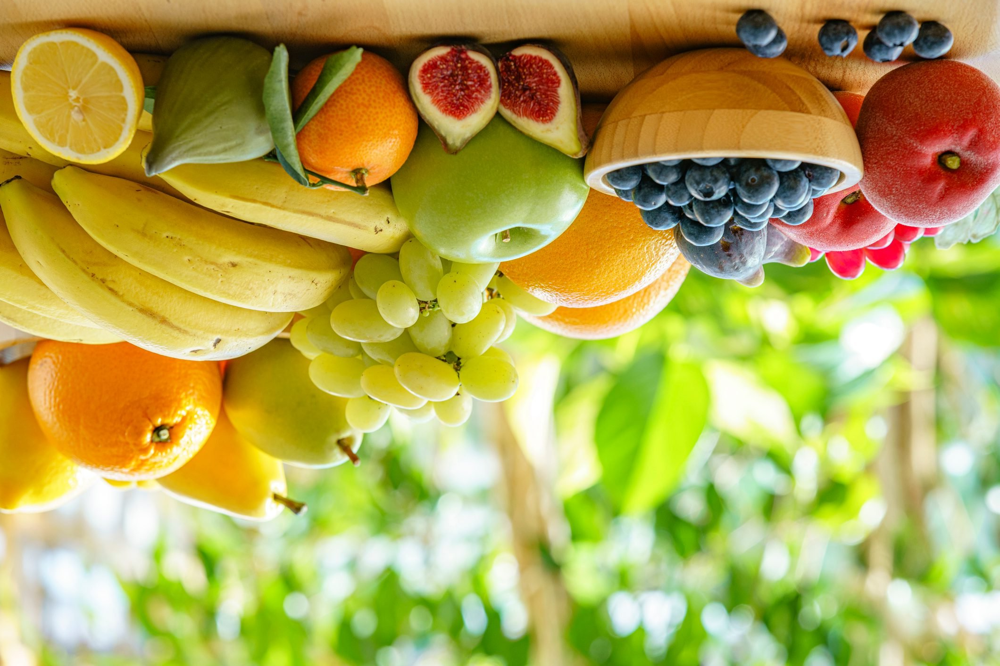

In [ ]:
img_flip = cv2.flip(img, -1)
cv2_imshow(img_flip)

In [ ]:
img = cv2.resize(img, (img.shape[1]//3, img.shape[0]//3))

**Image Threshold**

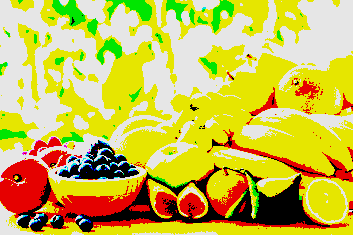

110.0


In [ ]:
tval, timg = cv2.threshold(img, 110, 230, cv2.THRESH_BINARY)
cv2_imshow(timg)
print(tval)

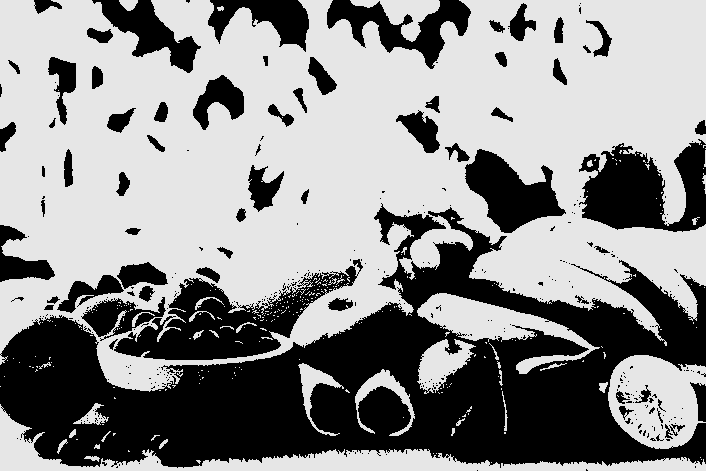

150.0


In [ ]:
tvalo, timgo = cv2.threshold(img_resize, 110, 230, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
cv2_imshow(timgo)
print(tvalo)

**Edge Detection**

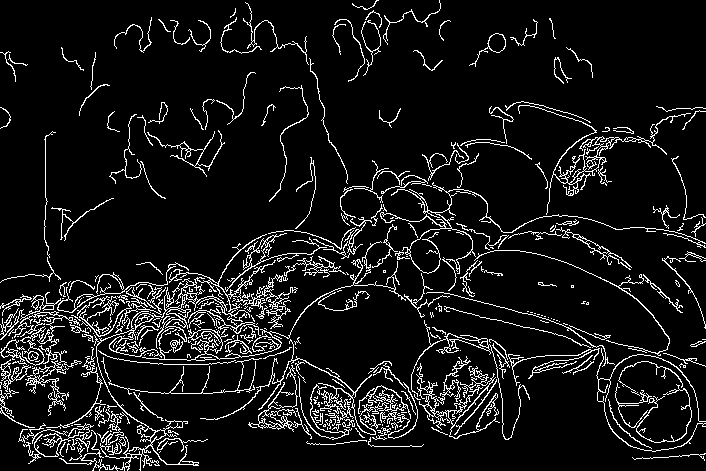

In [ ]:
edge = cv2.Canny(img_resize, 30, 200)
cv2_imshow(edge)

**Image Segmentation** using KMEAN

In [ ]:
px = img.reshape((-1, 3))
print(px)

[[118 220 192]
 [129 222 197]
 [138 221 199]
 ...
 [ 89 156 195]
 [ 91 158 197]
 [ 86 151 190]]


In [ ]:
px = numpy.float32(px)
print(px)

[[118. 220. 192.]
 [129. 222. 197.]
 [138. 221. 199.]
 ...
 [ 89. 156. 195.]
 [ 91. 158. 197.]
 [ 86. 151. 190.]]


In [ ]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.85)

In [ ]:
k = 3

In [ ]:
val, labels, centers = cv2.kmeans(px, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

In [ ]:
print(val, labels)

311766897.2577453 [[0]
 [0]
 [0]
 ...
 [1]
 [1]
 [1]]


In [ ]:
centers = numpy.uint8(centers)
print(centers)

[[180 223 214]
 [ 47 172 186]
 [ 17  81 109]]


In [ ]:
seg = centers[labels.flatten()]

In [ ]:
segimg = seg.reshape(img.shape)

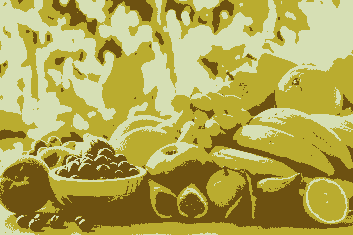

In [ ]:
cv2_imshow(segimg)

**Image Crop**

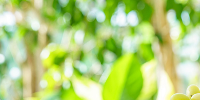

In [ ]:
img_crop = img[0:100, 0:200]
cv2_imshow(img_crop)

**Image Noise**

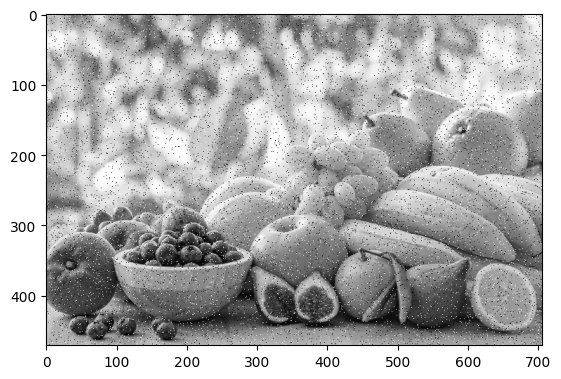

In [ ]:
img_gn = random_noise(img_resize, mode='s&p', amount=0.05)
plt.imshow(img_gn, cmap='gray')

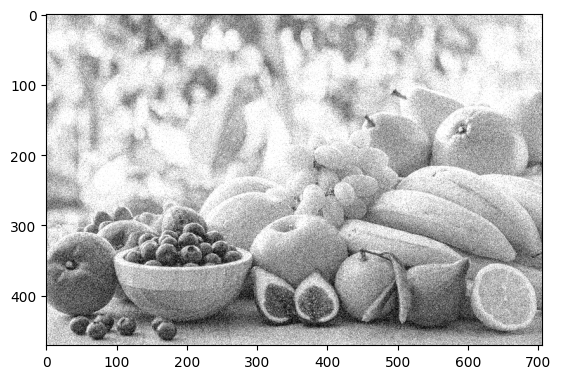

In [ ]:
img_gn = random_noise(img_resize, mode='gaussian', mean=0.1, var=0.01)
plt.imshow(img_gn, cmap='gray')

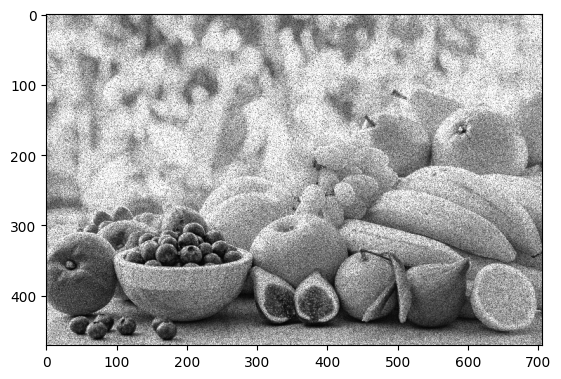

In [ ]:
img_gn = random_noise(img_resize, mode='speckle', var=0.05)
plt.imshow(img_gn, cmap='gray')

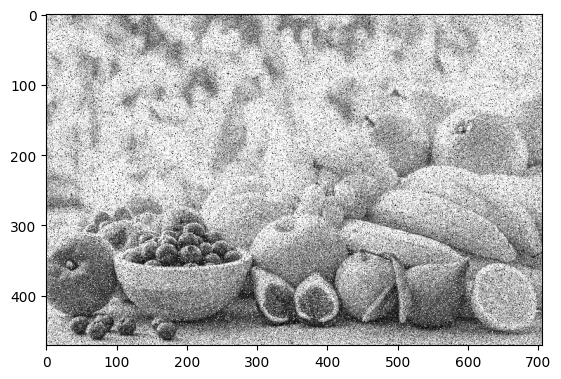

In [ ]:
img_gn = random_noise(img_resize, mode='s&p', amount=0.05)
img_gn = random_noise(img_gn, mode='gaussian', mean=0.1, var=0.01)
img_gn = random_noise(img_gn, mode='speckle', var=0.05)
plt.imshow(img_gn, cmap='gray')

**Image Denoise**

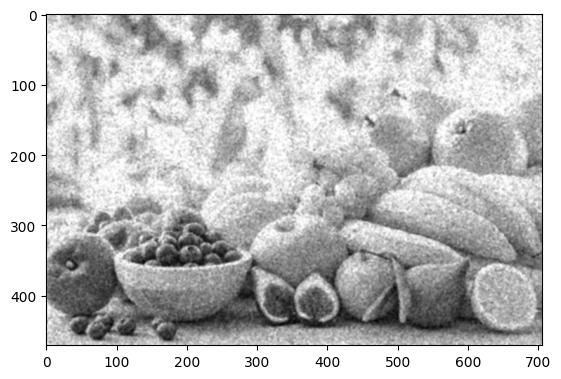

In [ ]:
imgd = cv2.medianBlur(img_gn.astype(numpy.float32), 3)
imgd = cv2.GaussianBlur(imgd, (3, 3), 1)
plt.imshow(imgd, cmap='gray')

In [ ]:
img.ravel()

array([118, 220, 192, ...,  86, 151, 190], dtype=uint8)

**Image Histograme**

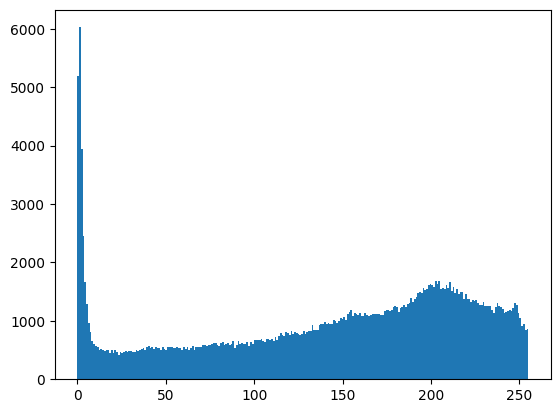

In [ ]:
plt.hist(img.ravel(), bins=256, range=[0, 255])
plt.show()

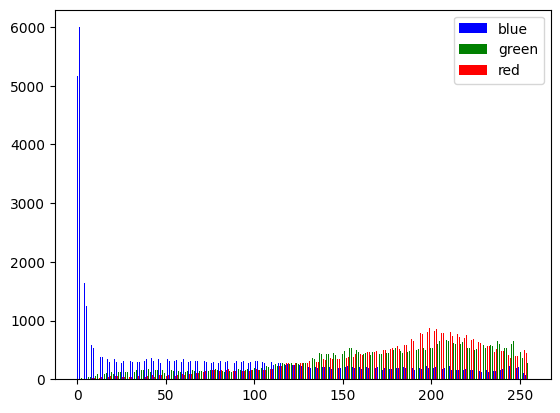

In [ ]:
img_ravel = [img[:, :, 0].ravel(), img[:, :, 1].ravel(), img[:, :, 2].ravel()]
plt.hist(img_ravel, color=['b', 'g', 'r'], label=['blue', 'green', 'red'], bins=256, range=[0, 255])
plt.legend()
plt.show()

**Fourier Transform**

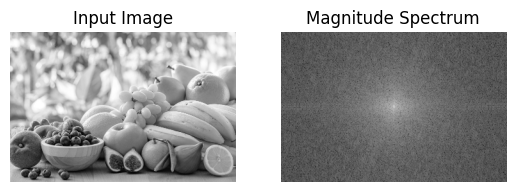

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

f = numpy.fft.fft2(gray) #computes the 2D Fourier Transform
fshift = numpy.fft.fftshift(f)  # Shift zero frequency to center
magnitude_spectrum = 20 * numpy.log(numpy.abs(fshift) + 1)  # Add +1 to avoid log(0)

# Display original and spectrum
plt.subplot(121), plt.imshow(gray, cmap='gray')
plt.title('Input Image'), plt.axis('off')

plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum'), plt.axis('off')

plt.show()

**np.fft.fft2** transforms it from the spatial domain (pixels) into the frequency domain (sinusoidal components).

By default, the FFT result places the low-frequency components (DC component) in the corners of the array.

**np.fft.fftshift** re-centers the spectrum so that the low frequencies are in the middle and high frequencies spread outward.

**np.abs(fshift)** → gets the magnitude of the complex numbers (since FFT output is complex).

**np.log(...)** → applies logarithmic scaling because raw magnitudes vary hugely (some values are extremely large compared to others).

**+1** → prevents log(0) which is undefined.

**20** * (..) → scales the values for better contrast in visualization (common practice in signal/image processing).



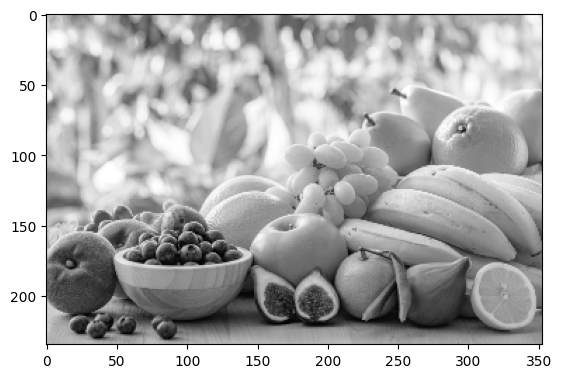

In [ ]:
img_reconstructed = numpy.fft.ifft2(numpy.fft.ifftshift(fshift))
img_reconstructed = numpy.abs(img_reconstructed)
plt.imshow(img_reconstructed, cmap="gray")